# Week 7 Assignment

In [1]:
# for data wrangling
import pandas as pd

# for interactive plots
import plotly.express as px

# to import open data
from sodapy import Socrata

In [2]:
# connect to the data portal
client = Socrata("data.lacity.org", None)

# First 2000 results, returned as JSON from API / converted to Python list of
# dictionaries by sodapy.
results = client.get("amvf-fr72", limit=2000)

# Convert to pandas DataFrame
arrest = pd.DataFrame.from_records(results)

# print it with .sample, which gives you random rows
arrest.sample(2)


,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,sex_cd,descent_cd,...,location_1,:@computed_region_k96s_3jcv,:@computed_region_tatf_ua23,bkg_date,bkg_time,bgk_location,:@computed_region_kqwf_mjcx,:@computed_region_2dna_qi2s,bkg_loc_cd,:@computed_region_ur2y_g4cx
751,201908881,RFC,2020-04-18T00:00:00.000,2020,19,Mission,1982,37,M,H,...,"{'type': 'Point', 'coordinates': [-118.4676, 3...",126,420,NaN,NaN,NaN,3,73,NaN,NaN
313,5940790,BOOKING,2020-05-27T00:00:00.000,1335,19,Mission,1985,16,F,H,...,"{'type': 'Point', 'coordinates': [-118.4502, 3...",146,417,2020-05-27T00:00:00.000,1615,VALLEY - JAIL DIV,3,59,4279,NaN


In [3]:
arrest.shape

(2000, 31)

In [4]:
arrest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 31 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   rpt_id                       2000 non-null   object
 1   report_type                  2000 non-null   object
 2   arst_date                    2000 non-null   object
 3   time                         1999 non-null   object
 4   area                         2000 non-null   object
 5   area_desc                    2000 non-null   object
 6   rd                           2000 non-null   object
 7   age                          2000 non-null   object
 8   sex_cd                       2000 non-null   object
 9   descent_cd                   2000 non-null   object
 10  chrg_grp_cd                  1848 non-null   object
 11  grp_description              1847 non-null   object
 12  arst_typ_cd                  2000 non-null   object
 13  charge                       2000

In [5]:
arrest.head()

,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,sex_cd,descent_cd,...,location_1,:@computed_region_k96s_3jcv,:@computed_region_tatf_ua23,bkg_date,bkg_time,bgk_location,:@computed_region_kqwf_mjcx,:@computed_region_2dna_qi2s,bkg_loc_cd,:@computed_region_ur2y_g4cx
0,5926725,BOOKING,2020-05-05T00:00:00.000,1840,10,West Valley,1005,49,M,H,...,"{'type': 'Point', 'coordinates': [-118.5252, 3...",253,284,2020-05-05T00:00:00.000,2018,VALLEY - JAIL DIV,2,12,4279,NaN
1,5979761,BOOKING,2020-07-27T00:00:00.000,1025,06,Hollywood,0666,38,M,B,...,"{'type': 'Point', 'coordinates': [-118.3277, 3...",424,468,2020-07-27T00:00:00.000,1233,HOLLYWOOD,8,34,4206,NaN
2,5945665,BOOKING,2020-05-31T00:00:00.000,2250,05,Harbor,0557,32,M,B,...,"{'type': 'Point', 'coordinates': [-118.2923, 3...",975,1205,2020-06-01T00:00:00.000,0024,HARBOR,15,36,4205,NaN
3,201205876,RFC,2020-01-27T00:00:00.000,1600,12,77th Street,1245,48,F,H,...,"{'type': 'Point', 'coordinates': [-118.2917, 3...",771,1159,NaN,NaN,NaN,14,35,NaN,7
4,5892945,BOOKING,2020-03-04T00:00:00.000,1905,05,Harbor,0504,24,F,H,...,"{'type': 'Point', 'coordinates': [-118.3041, 3...",944,825,2020-03-04T00:00:00.000,2042,HARBOR,15,55,4205,NaN


In [20]:
# add a "where" statement
results = client.get("amvf-fr72", 
                     limit = 20000, # putting an arbitrary high number (otherwise defaults to 1000)
                     where = "arst_date between '2021-06-01T00:00:00' and '2021-08-31T00:00:00'"
                    )

In [21]:
# Convert to pandas DataFrame
arrest = pd.DataFrame.from_records(results)

In [22]:
# how many rows and columns?
arrest.shape

(17464, 25)

In [23]:
# what fields and datatypes?
arrest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17464 entries, 0 to 17463
Data columns (total 25 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   rpt_id           17464 non-null  object
 1   report_type      17464 non-null  object
 2   arst_date        17464 non-null  object
 3   time             17462 non-null  object
 4   area             17464 non-null  object
 5   area_desc        17464 non-null  object
 6   rd               17464 non-null  object
 7   age              17464 non-null  object
 8   sex_cd           17464 non-null  object
 9   descent_cd       17464 non-null  object
 10  chrg_grp_cd      16323 non-null  object
 11  grp_description  16321 non-null  object
 12  arst_typ_cd      17464 non-null  object
 13  charge           17464 non-null  object
 14  chrg_desc        16323 non-null  object
 15  dispo_desc       16149 non-null  object
 16  location         17464 non-null  object
 17  lat              17464 non-null

In [24]:
# what are the first 5 rows?
arrest.head()

,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,sex_cd,descent_cd,...,dispo_desc,location,lat,lon,location_1,bkg_date,bkg_time,bgk_location,bkg_loc_cd,crsst
0,6190030,BOOKING,2021-06-01T00:00:00.000,1130,03,Southwest,0375,20,M,B,...,CITY ATTORNEY REJECT,2000 W MARTIN LUTHER KI BL,34.0146,-118.313,"{'type': 'Point', 'coordinates': [-118.313, 34...",2021-06-01T00:00:00.000,1410,77TH ST,4212,NaN
1,211510358,RFC,2021-06-01T00:00:00.000,0900,15,N Hollywood,1513,19,M,H,...,MISDEMEANOR COMPLAINT FILED,WHITSETT,34.1985,-118.4053,"{'type': 'Point', 'coordinates': [-118.4053, 3...",NaN,NaN,NaN,NaN,VOSE
2,6189982,BOOKING,2021-06-01T00:00:00.000,1225,09,Van Nuys,0935,35,M,H,...,NaN,14400 ERWIN ST,34.1837,-118.4422,"{'type': 'Point', 'coordinates': [-118.4422, 3...",2021-06-01T00:00:00.000,1232,VALLEY - JAIL DIV,4279,NaN
3,6189891,BOOKING,2021-06-01T00:00:00.000,0715,10,West Valley,1035,33,M,H,...,MISDEMEANOR COMPLAINT FILED,6700 LINDLEY AV,34.1921,-118.5273,"{'type': 'Point', 'coordinates': [-118.5273, 3...",2021-06-01T00:00:00.000,0846,VALLEY - JAIL DIV,4279,NaN
4,6190217,BOOKING,2021-06-01T00:00:00.000,1900,18,Southeast,1864,24,M,B,...,MISDEMEANOR COMPLAINT FILED,800 E 116TH ST,33.9292,-118.2604,"{'type': 'Point', 'coordinates': [-118.2604, 3...",2021-06-01T00:00:00.000,2117,77TH ST,4212,NaN


In [25]:
arrest.tail()

,rpt_id,report_type,arst_date,time,area,area_desc,rd,age,sex_cd,descent_cd,...,dispo_desc,location,lat,lon,location_1,bkg_date,bkg_time,bgk_location,bkg_loc_cd,crsst
17459,6240362,BOOKING,2021-08-31T00:00:00.000,2150,06,Hollywood,0645,23,M,B,...,MISDEMEANOR COMPLAINT FILED,WILCOX,34.1006,-118.3417,"{'type': 'Point', 'coordinates': [-118.3417, 3...",2021-08-31T00:00:00.000,2302,HOLLYWOOD,4206,YUCCA
17460,6240412,BOOKING,2021-08-31T00:00:00.000,2331,16,Foothill,1681,31,M,H,...,NaN,ROSCOE BL,34.2251,-118.4039,"{'type': 'Point', 'coordinates': [-118.4039, 3...",2021-09-01T00:00:00.000,0116,VALLEY - JAIL DIV,4279,HOLLYWOOD FY
17461,6240123,BOOKING,2021-08-31T00:00:00.000,0950,17,Devonshire,1762,37,M,W,...,FELONY COMPLAINT FILED,21100 PLUMMER ST,34.2465,-118.5841,"{'type': 'Point', 'coordinates': [-118.5841, 3...",2021-08-31T00:00:00.000,1211,VALLEY - JAIL DIV,4279,NaN
17462,6239957,BOOKING,2021-08-31T00:00:00.000,0005,12,77th Street,1253,25,M,B,...,849(B)(1) PC/TECHNICAL ARREST,FLORENCE AV,33.9746,-118.3177,"{'type': 'Point', 'coordinates': [-118.3177, 3...",2021-08-31T00:00:00.000,0319,77TH ST,4212,VAN NESS
17463,6240258,BOOKING,2021-08-31T00:00:00.000,1740,06,Hollywood,0677,26,M,W,...,FELONY COMPLAINT FILED,5900 SANTA MONICA BL,34.0865,-118.3169,"{'type': 'Point', 'coordinates': [-118.3169, 3...",2021-08-31T00:00:00.000,1818,HOLLYWOOD,4206,NaN


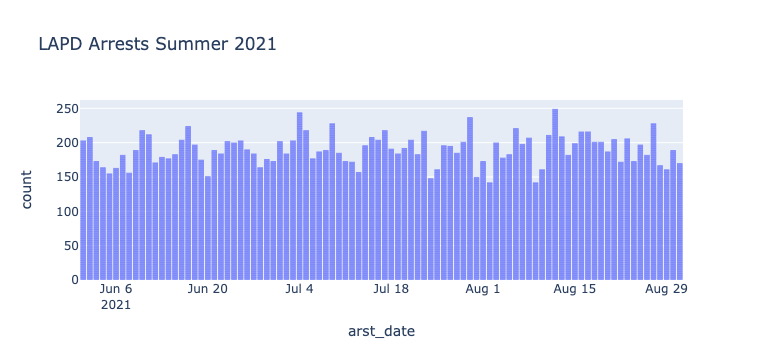

In [27]:
# a simple bar chart, putting date on the x-axis
fig = px.bar(arrest,
       x='arst_date',
       title='LAPD Arrests Summer 2021'
      )

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

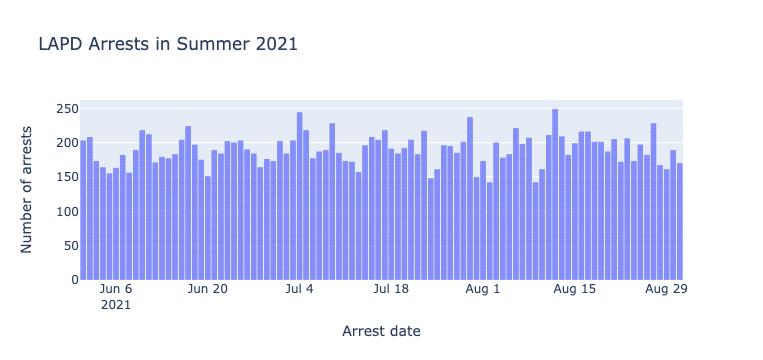

In [28]:

fig = px.bar(
        arrest,
        x='arst_date',
        title='LAPD Arrests in Summer 2021',
        labels={
            'arst_date':'Arrest date',
            'count':'Number of arrests'
        }
)

fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

Peaks:
* June 1,Weekend
* June 2, Weekend
* June 10, Thursday
* June 11, Friday 
* June 17, Thursday 
* July 4, Holiday
* July 9, Friday 
* July 17 Saturday 
* July 21 Wednesday
* July 23 Friday
* July 30 Friday
* August 6 Friday
* August 12 Thursday
* August 27 Friday

Overall the trends we see by looking at this map suggests that more arrests are made closer to the weekends during the summer of 2021

In [30]:
fig.write_html("summer_arrests_plotly.html")

In [29]:
#Now let's take a look into the types of arrests that are being made
arrest.grp_description.unique().tolist()

['Robbery',
 nan,
 'Other Assaults',
 'Sex (except rape/prst)',
 'Weapon (carry/poss)',
 'Aggravated Assault',
 'Vehicle Theft',
 'Miscellaneous Other Violations',
 'Narcotic Drug Laws',
 'Driving Under Influence',
 'Moving Traffic Violations',
 'Burglary',
 'Receive Stolen Property',
 'Larceny',
 'Prostitution/Allied',
 'Gambling',
 'Liquor Laws',
 'Non-Criminal Detention',
 'Fraud/Embezzlement',
 'Homicide',
 'Drunkeness',
 'Against Family/Child',
 'Forgery/Counterfeit',
 'Rape',
 'Disorderly Conduct',
 'Disturbing the Peace',
 'Federal Offenses',
 'Pre-Delinquency']

In [31]:
# Let's look at how many arrests were made by arrest description
arrest_by_charge = arrest.grp_description.value_counts().reset_index()
arrest_by_charge

,index,grp_description
0,Aggravated Assault,2480
1,Miscellaneous Other Violations,2321
2,Driving Under Influence,1689
3,Other Assaults,1682
4,Weapon (carry/poss),1474
5,Narcotic Drug Laws,1358
6,Vehicle Theft,863
7,Prostitution/Allied,695
8,Robbery,543
9,Moving Traffic Violations,517


In [32]:
# Let's change the name of our columns to make it easier to understand when we chart them
arrest_by_charge.columns=['charge','count']
arrest_by_charge

,charge,count
0,Aggravated Assault,2480
1,Miscellaneous Other Violations,2321
2,Driving Under Influence,1689
3,Other Assaults,1682
4,Weapon (carry/poss),1474
5,Narcotic Drug Laws,1358
6,Vehicle Theft,863
7,Prostitution/Allied,695
8,Robbery,543
9,Moving Traffic Violations,517


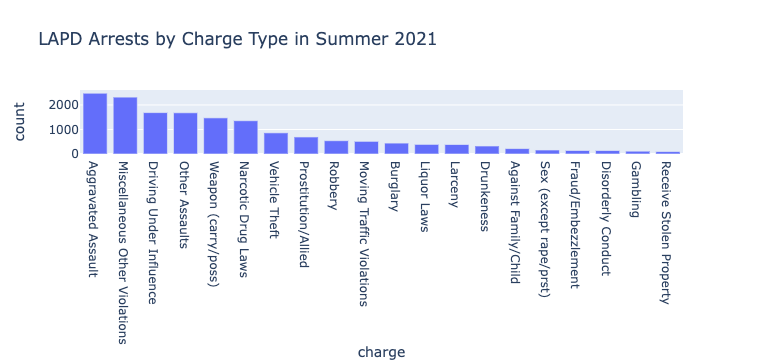

In [33]:
# plot the top 20 charges
fig = px.bar(arrest_by_charge.head(20),
       x='charge',
       y='count',
       title='LAPD Arrests by Charge Type in Summer 2021')

fig.show()

Now, let's look at the amount of arrests that were made by day and by arrest types to get a better understanding of what types of arrest are being made on a daily basis during the summer. Let's do this by using a groupby function.

In [34]:
arrest_grouped=arrest.groupby(['arst_date','grp_description']).count()[['rpt_id']]
arrest_grouped.head(50)

rpt_id
arst_date               grp_description                       
2021-06-01T00:00:00.000 Aggravated Assault                  31
                        Burglary                             6
                        Driving Under Influence             17
                        Fraud/Embezzlement                   2
                        Gambling                            11
                        Homicide                             1
                        Larceny                              4
                        Liquor Laws                          2
                        Miscellaneous Other Violations      24
                        Moving Traffic Violations            3
                        Narcotic Drug Laws                  13
                        Non-Criminal Detention               1
                        Other Assaults                      24
                        Prostitution/Allied                  2
                        Receive Stolen Property              2
                        Robbery                             12
                        Sex (except rape/prst)               5
                        Vehicle Theft                        9
                        Weapon (carry/poss)                 22
2021-06-02T00:00:00.000 Against Family/Child                 1
                        Aggravated Assault                  19
                        Burglary                             5
                        Driving Under Influence             12
                        Drunkeness                           5
                        Forgery/Counterfeit                  1
                        Fraud/Embezzlement                   4
                        Gambling                            11
                        Homicide                             1
                        Larceny                              5
                        Liquor Laws                          1
                        Miscellaneous Other Violations      32
                        Moving Traffic Violations            5
                        Narcotic Drug Laws                  24
                        Non-Criminal Detention               1
                        Other Assaults                      19
                        Prostitution/Allied                 26
                        Robbery                              2
                        Sex (except rape/prst)               3
                        Vehicle Theft                        7
                        Weapon (carry/poss)                 11
2021-06-03T00:00:00.000 Against Family/Child                 1
                        Aggravated Assault                  23
                        Burglary                             8
                        Driving Under Influence             11
                        Drunkeness                           1
                        Forgery/Counterfeit                  1
                        Fraud/Embezzlement                   2
                        Homicide                             1
                        Larceny                              2
                        Liquor Laws                          3

Before we can chart this, we have to flatten the multi-level, multi-index dataframe 

In [35]:
arrest_flat = arrest_grouped.reset_index()
arrest_flat

,arst_date,grp_description,rpt_id
0,2021-06-01T00:00:00.000,Aggravated Assault,31
1,2021-06-01T00:00:00.000,Burglary,6
2,2021-06-01T00:00:00.000,Driving Under Influence,17
3,2021-06-01T00:00:00.000,Fraud/Embezzlement,2
4,2021-06-01T00:00:00.000,Gambling,11
...,...,...,...
1767,2021-08-31T00:00:00.000,Receive Stolen Property,2
1768,2021-08-31T00:00:00.000,Robbery,1
1769,2021-08-31T00:00:00.000,Sex (except rape/prst),2
1770,2021-08-31T00:00:00.000,Vehicle Theft,3


Again, let's change the name of our columns to better understand when we chart them...

In [36]:
arrest_flat = arrest_flat.rename(columns={'rpt_id':'count'})
arrest_flat

,arst_date,grp_description,count
0,2021-06-01T00:00:00.000,Aggravated Assault,31
1,2021-06-01T00:00:00.000,Burglary,6
2,2021-06-01T00:00:00.000,Driving Under Influence,17
3,2021-06-01T00:00:00.000,Fraud/Embezzlement,2
4,2021-06-01T00:00:00.000,Gambling,11
...,...,...,...
1767,2021-08-31T00:00:00.000,Receive Stolen Property,2
1768,2021-08-31T00:00:00.000,Robbery,1
1769,2021-08-31T00:00:00.000,Sex (except rape/prst),2
1770,2021-08-31T00:00:00.000,Vehicle Theft,3


Let's chart this!

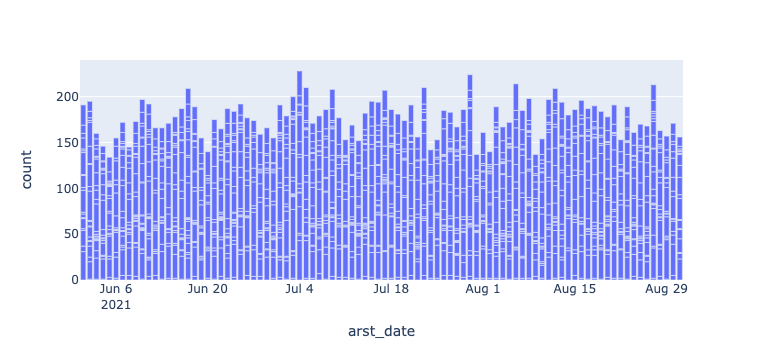

In [37]:
# make a bar chart
fig = px.bar(arrest_flat,
       x='arst_date',
       y='count'
)

fig.show()

okay, so let's clean this up a bit now and stach our bar chart...

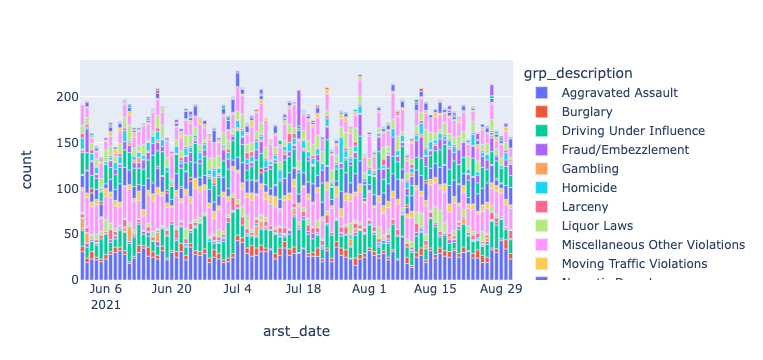

In [38]:
fig = px.bar(arrest_flat,
       x='arst_date',
       y='count',
       color='grp_description' 
)

fig.show()

interesting... looks like majority of arrests that were made on a daily basis were for aggravated assault, driving under the influence, "miscellaneous" or "other" violations, narctoic drug laws, "other" assaults, and carrying or possessing a weapon. It would be interesting to knoe what "miscellaneous" or "other" violations mean since this category is among the highest but there is no clear description of what those arrests were made for. If LAPD is using a data-informed approach to their policing methods, how would they explain what these arrests were made for and how would this accurately show how they are making efforts to reduce these types of arrests. 

Note also: 41.18 was passed during the summer, do those "miscellaneous" violations include incarcerating houseless people?

Lots to uncover but let's look at our data again and see how to clean it up!

In [39]:
fig.write_html("arrest_types_stacked_plotly.html")

In [40]:
arrest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17464 entries, 0 to 17463
Data columns (total 25 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   rpt_id           17464 non-null  object
 1   report_type      17464 non-null  object
 2   arst_date        17464 non-null  object
 3   time             17462 non-null  object
 4   area             17464 non-null  object
 5   area_desc        17464 non-null  object
 6   rd               17464 non-null  object
 7   age              17464 non-null  object
 8   sex_cd           17464 non-null  object
 9   descent_cd       17464 non-null  object
 10  chrg_grp_cd      16323 non-null  object
 11  grp_description  16321 non-null  object
 12  arst_typ_cd      17464 non-null  object
 13  charge           17464 non-null  object
 14  chrg_desc        16323 non-null  object
 15  dispo_desc       16149 non-null  object
 16  location         17464 non-null  object
 17  lat              17464 non-null

Since theres a lot of fields, let's take out the fields most interesting or useful for us to look at

In [41]:
arrest_mini = arrest[['arst_date','area_desc','descent_cd','grp_description','lat','lon']]

In [42]:
arrest_mini.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17464 entries, 0 to 17463
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   arst_date        17464 non-null  object
 1   area_desc        17464 non-null  object
 2   descent_cd       17464 non-null  object
 3   grp_description  16321 non-null  object
 4   lat              17464 non-null  object
 5   lon              17464 non-null  object
dtypes: object(6)
memory usage: 818.8+ KB


Looks like we need to convert our lats and longs into floats...

In [43]:
arrest_mini['lat'] = arrest_mini['lat'].astype(float)
arrest_mini['lon'] = arrest_mini['lon'].astype(float)
arrest_mini.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17464 entries, 0 to 17463
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   arst_date        17464 non-null  object 
 1   area_desc        17464 non-null  object 
 2   descent_cd       17464 non-null  object 
 3   grp_description  16321 non-null  object 
 4   lat              17464 non-null  float64
 5   lon              17464 non-null  float64
dtypes: float64(2), object(4)
memory usage: 818.8+ KB


/tmp/ipykernel_826/1256201848.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_826/1256201848.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



What if we do a scatter plot with this data?

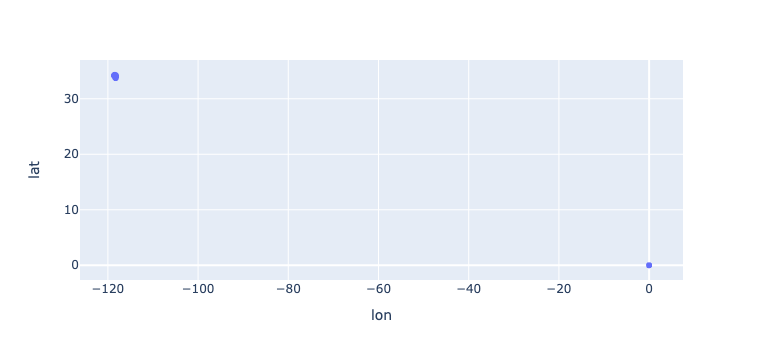

In [44]:
fig = px.scatter(arrest_mini,
           x='lon',
           y='lat'
)

fig.show()

Seems like we have an outlier... what is it?

In [45]:
arrest_mini[arrest_mini.lon == 0]

,arst_date,area_desc,descent_cd,grp_description,lat,lon
178,2021-06-01T00:00:00.000,Pacific,W,Miscellaneous Other Violations,0.0,0.0
179,2021-06-01T00:00:00.000,Pacific,B,Miscellaneous Other Violations,0.0,0.0
180,2021-06-01T00:00:00.000,Rampart,H,Gambling,0.0,0.0
181,2021-06-01T00:00:00.000,Rampart,W,Narcotic Drug Laws,0.0,0.0
182,2021-06-01T00:00:00.000,Rampart,K,Narcotic Drug Laws,0.0,0.0
...,...,...,...,...,...,...
17390,2021-08-31T00:00:00.000,Rampart,W,Narcotic Drug Laws,0.0,0.0
17425,2021-08-31T00:00:00.000,Southwest,B,Burglary,0.0,0.0
17433,2021-08-31T00:00:00.000,Olympic,H,Prostitution/Allied,0.0,0.0
17436,2021-08-31T00:00:00.000,Rampart,H,Narcotic Drug Laws,0.0,0.0


Let's drop the outliers and keep the other rows using a not equal notation (!=)

In [46]:
arrest_mini = arrest_mini[arrest_mini.lon != 0]

Let's plot this again...

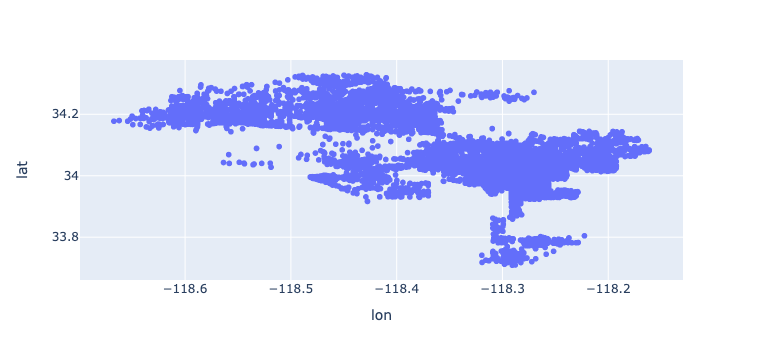

In [47]:
fig = px.scatter(arrest_mini,
           x='lon',
           y='lat'
)

fig.show()

Let's use plotly maps to make this more interactive

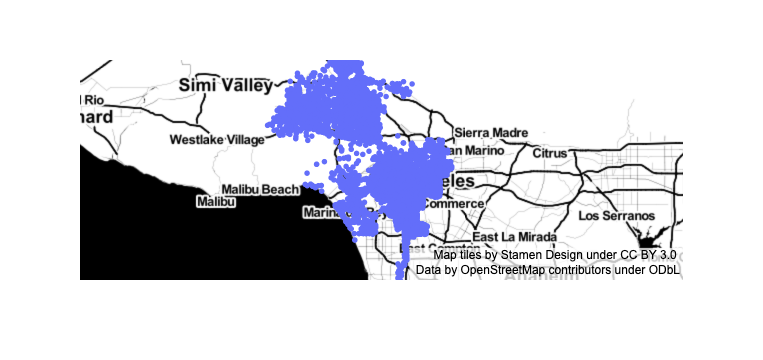

In [48]:
fig = px.scatter_mapbox(arrest_mini,
                        lat='lat',
                        lon='lon',
                        mapbox_style="stamen-toner")
fig.show()

does most crime happen near the 110 freeway? interesting

Let's try plotting this according to race

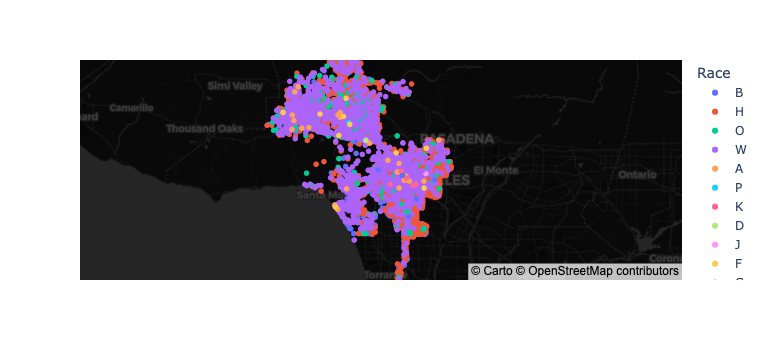

In [49]:
fig = px.scatter_mapbox(arrest_mini, 
                        lat="lat", 
                        lon="lon", 
                        color="descent_cd",
                        labels={'descent_cd':'Race'}
                       )

fig.update_layout(mapbox_style="carto-darkmatter")

fig.show()

Lot's of Black and Hispanic arrests just based on this scatterplot... what would this look like if we label it by area_desc

In [50]:
fig.write_html("arrests_racemap_plotly.html")

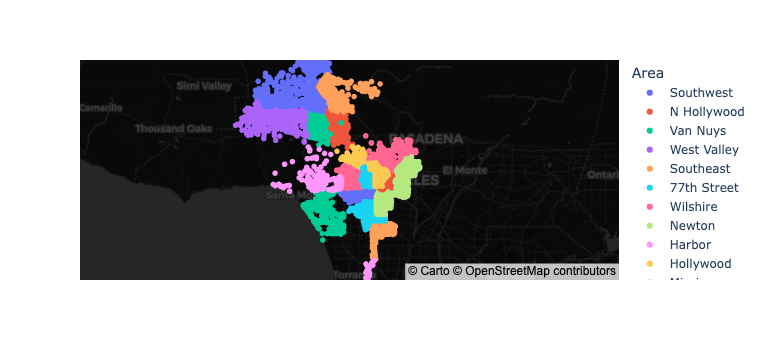

In [51]:
fig = px.scatter_mapbox(arrest_mini, 
                        lat="lat", 
                        lon="lon", 
                        color="area_desc",
                        labels={'area_desc':'Area'}
                       )

fig.update_layout(mapbox_style="carto-darkmatter")

fig.show()

Looking at this scatter plot... West LA is highlighted in the light pink on the western part of this map. South LA is represented by the 77th Street division (the orange on the map), Newton Police Station(in the magenta) just to the east of 77th, and South West (in the purple) just west of 77th. South LA divisions are located centrally in this map. The 110 and 10 freeway border the South LA police stations as well. 

Now, let's look at how we can create a function...

In [52]:
fig.write_html("arrests_areamap_plotly.html")

In [53]:
def race_map(race='H'):
    
    fig = px.scatter_mapbox(
                            arrest_mini[arrest_mini.descent_cd==race], 
                            lat="lat", 
                            lon="lon", 
                            color="descent_cd",
                            labels={'descent_cd':'Race'}
                           )

    fig.update_layout(mapbox_style="carto-darkmatter")

    fig.show()

What if we call it to plot Hispanic arrests...

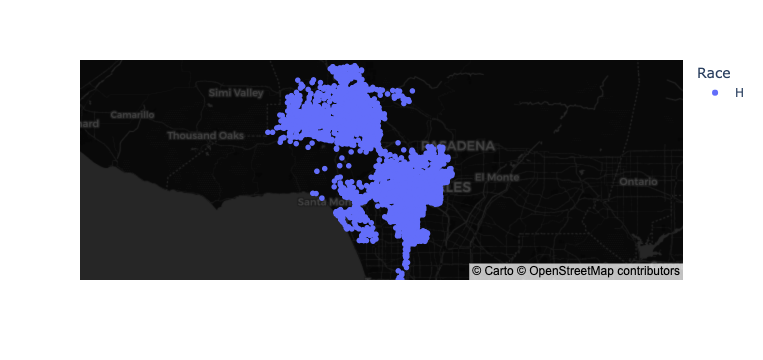

In [54]:
race_map(race='H')

okay, now let's look into calling it to plot Black arrests...will there be any similarities?

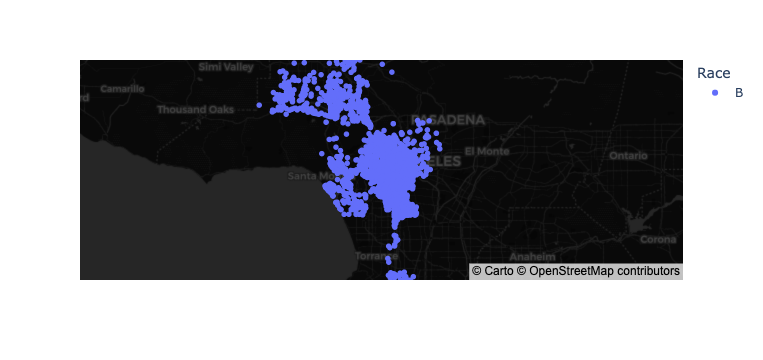

In [55]:
race_map(race='B')

interesting, both of these have very similar visualizations. However, it seems like there are more Hispanic arrests made in the Burbank and San Fernando area than there are Black arrests. The demographics in this area might account for why there are more Hispanic arrests than Black arrest, but it still does not give us a full picture. 

Now, let's create a loop and map...

In [56]:
area_list = arrest_mini.area_desc.unique().tolist()
area_list

['Southwest',
 'N Hollywood',
 'Van Nuys',
 'West Valley',
 'Southeast',
 '77th Street',
 'Wilshire',
 'Newton',
 'Harbor',
 'Hollywood',
 'Mission',
 'Central',
 'Pacific',
 'Topanga',
 'Foothill',
 'Olympic',
 'Northeast',
 'Hollenbeck',
 'West LA',
 'Rampart',
 'Devonshire']

In [57]:
def area_map(area='77th Street'):
    
    fig = px.scatter_mapbox(
                            arrest_mini[arrest_mini.area_desc==area], 
                            lat="lat", 
                            lon="lon", 
                            color="area_desc",
                            labels={'area_desc':'Area'}
                           )

    fig.update_layout(mapbox_style="carto-darkmatter")

    fig.show()

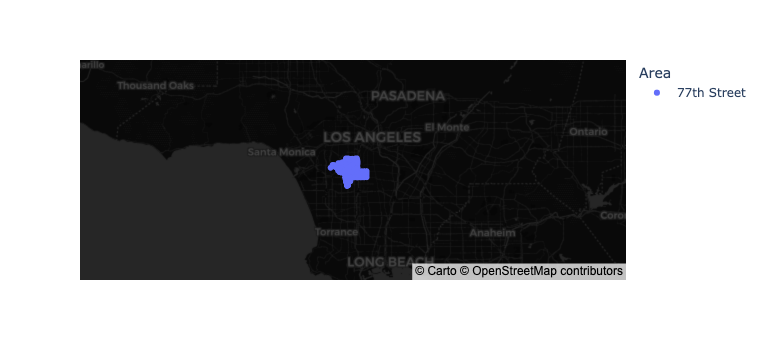

In [58]:
area_map(area='77th Street')

In [59]:
for area in area_list:
    area_map(area)